# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [2]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

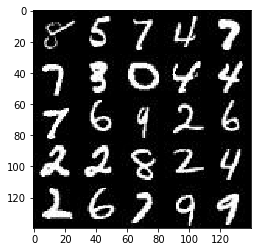

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

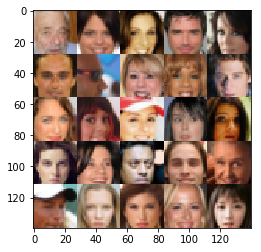

In [4]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [5]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [6]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real_image = tf.placeholder(dtype=tf.float32,
                                shape=[None,image_width,image_height,image_channels],
                               name='real_image')
    z_input = tf.placeholder(dtype =tf.float32,shape=[None,z_dim],name='z_input')  
    learning_rate = tf.placeholder(dtype=tf.float32,name='learning_rate')                           
    return real_image, z_input, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [116]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha = 0.2#0.3#0.2#0.0002#0.002#0.2#0.1 #0.00001 #0.0005 #0.05
    with tf.variable_scope('discriminator',reuse=reuse) as discriminator:
        # Input layer is 28x28x3
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        #relu1 = tf.layers.dropout(relu1,rate=0.25)
        # 14x14x64
        
        '''x2 = tf.layers.conv2d(relu1, 64, 5, strides=1, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True,
                    moving_variance_initializer=tf.contrib.layers.xavier_initializer())
        relu2 = tf.maximum(alpha * bn2, bn2)'''
        # 14x14x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True,
                    moving_variance_initializer=tf.contrib.layers.xavier_initializer())
        relu2 = tf.maximum(alpha * bn2, bn2)
        #relu2 = tf.layers.dropout(relu2,rate=0.25)
        # 7x7x128
        
        '''x2 = tf.layers.conv2d(relu2, 128, 5, strides=1, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True,
                    moving_variance_initializer=tf.contrib.layers.xavier_initializer())
        relu2 = tf.maximum(alpha * bn2, bn2)'''
        
        # 7x7x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True,
                moving_variance_initializer=tf.contrib.layers.xavier_initializer())
        relu3 = tf.maximum(alpha * bn3, bn3)
        #relu3 = tf.layers.dropout(relu3,rate=0.25)
        # 4x4x256
        
        '''x3 = tf.layers.conv2d(relu3, 256, 5, strides=1, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True,
                moving_variance_initializer=tf.contrib.layers.xavier_initializer())
        relu3 = tf.maximum(alpha * bn3, bn3)'''
        # 4x4x256
        
        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [117]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    #print("out_channel_dim =",out_channel_dim)
    alpha = 0.001#0.0002#0.001#0.002#0.02#0.2#0.0002#0.002 #0.2#0.1 #0.00005#0.00001 #0.0005,0.05
    reuse = False if(is_train) else True
    
    with tf.variable_scope('generator',reuse=reuse):
        #tf.variable_scope('generator').reuse_variables()
        # First fully connected layer
        x1 = tf.layers.dense(z, 4*4*256)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 4, 4, 256))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 4x4x256 now  

        
        '''step7 = False#True
        if(step7):
            x2 = tf.layers.conv2d_transpose(x1, 128, 5, strides=7, padding='same')
            x2 = tf.layers.batch_normalization(x2, training=is_train)
            x2 = tf.maximum(alpha * x2, x2)
            
            # Output layer
            logits = tf.layers.conv2d_transpose(x2, out_channel_dim, 
                                                5, 
                                                strides=1, padding='same')
        
            # 28x28xout_channel_dim
        else:
        '''
        
        x2 = tf.layers.conv2d_transpose(x1, 128, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)        
        #8x8x128


        x2 = tf.layers.conv2d_transpose(x2, 64, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        #16x16x64

        '''x2 = tf.layers.conv2d_transpose(x2, 32, 5, strides=1, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)'''
        #x2 = tf.layers.dropout(x2)
        #16x16x32

        x2 = tf.layers.conv2d_transpose(x2, 32, 5, strides=1, padding='valid')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        #20x20x32

        x2 = tf.layers.conv2d_transpose(x2, 16, 5, strides=1, padding='valid')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        #24x24x16        

        '''x2 = tf.layers.conv2d_transpose(x2, 16, 5, strides=1, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)'''
        #x2 = tf.layers.dropout(x2)
        #24x24x16 

        # Output layer
        logits = tf.layers.conv2d_transpose(x2, out_channel_dim, 
                                            5, 
                                            strides=1, padding='valid')
        # 28x28xout_channel_dim        

        out = tf.tanh(logits)
    
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [118]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim, is_train=True)
    
    d_model_real, d_logits_real = discriminator(input_real, reuse=False)
    
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
    return d_loss,g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [119]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(
                                            d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(
            g_loss,var_list=g_vars)
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [120]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [121]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, 
          data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    #print("data_shape =",data_shape)
    input_real, input_z,learn_rate = model_inputs(data_shape[1],data_shape[2],
                                                  data_shape[3], z_dim)        
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
        
    d_opt, g_opt = model_opt(d_loss, g_loss, learn_rate, beta1)
    
    sample_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
    samples, losses = [], []
    steps = 0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                #print("batch_images type =",type(batch_images))
                # TODO: Train Model
                steps+=1
                #random noise for generator
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z,
                                              learn_rate:learning_rate})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images,
                                              learn_rate:learning_rate})
                
                if steps % 100 == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % 100 == 0:
                    gen_samples = sess.run(
                                   generator(input_z, data_shape[3], is_train=False),
                                   feed_dict={input_z: sample_z})
                    samples.append(gen_samples)
                    
                    show_generator_output(sess, batch_size, input_z, 
                                          data_shape[3], data_image_mode)
                    
                    
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 0.1452... Generator Loss: 4.1159


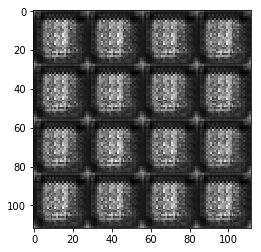

Epoch 1/2... Discriminator Loss: 0.2292... Generator Loss: 10.2197


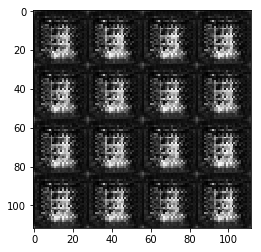

Epoch 1/2... Discriminator Loss: 0.3007... Generator Loss: 9.0378


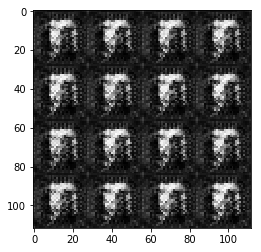

Epoch 1/2... Discriminator Loss: 0.5664... Generator Loss: 1.7972


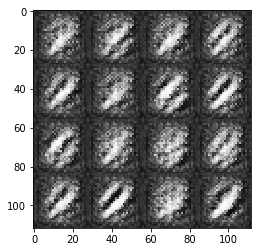

Epoch 1/2... Discriminator Loss: 0.5612... Generator Loss: 5.9438


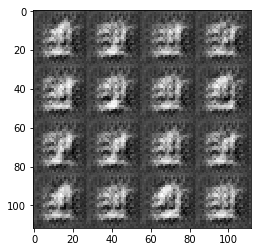

Epoch 1/2... Discriminator Loss: 0.9887... Generator Loss: 0.6623


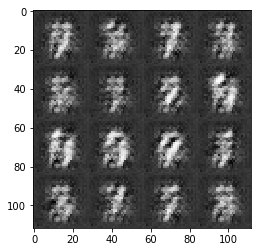

Epoch 1/2... Discriminator Loss: 0.6044... Generator Loss: 1.0657


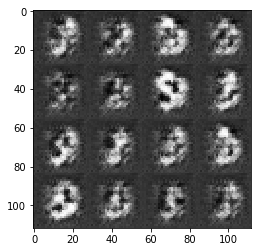

Epoch 1/2... Discriminator Loss: 1.8788... Generator Loss: 9.0073


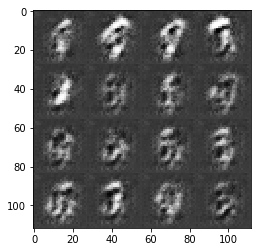

Epoch 1/2... Discriminator Loss: 0.1359... Generator Loss: 2.9210


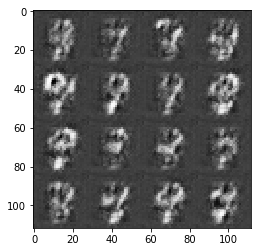

Epoch 1/2... Discriminator Loss: 0.6213... Generator Loss: 0.9581


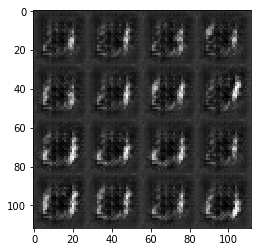

Epoch 1/2... Discriminator Loss: 0.1794... Generator Loss: 2.2870


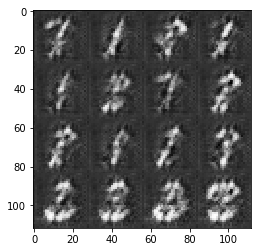

Epoch 1/2... Discriminator Loss: 0.3812... Generator Loss: 1.4007


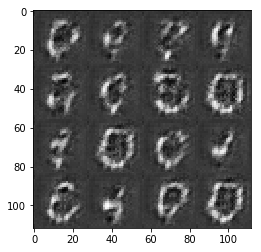

Epoch 1/2... Discriminator Loss: 0.2350... Generator Loss: 1.8252


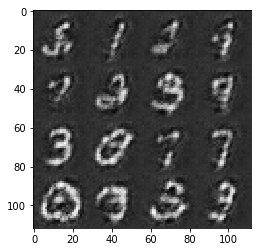

Epoch 1/2... Discriminator Loss: 0.3911... Generator Loss: 1.3671


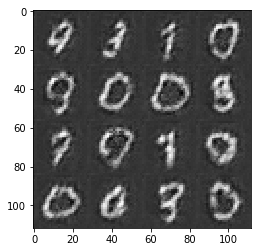

Epoch 1/2... Discriminator Loss: 0.1267... Generator Loss: 2.4730


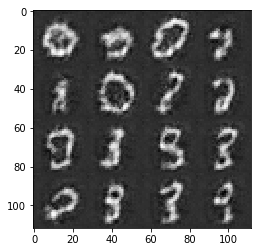

Epoch 1/2... Discriminator Loss: 1.0067... Generator Loss: 3.5098


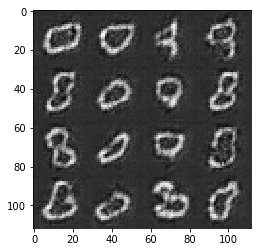

Epoch 1/2... Discriminator Loss: 0.2275... Generator Loss: 2.0529


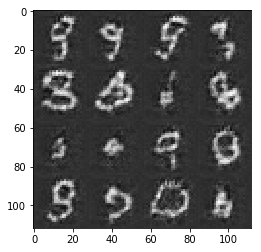

Epoch 1/2... Discriminator Loss: 0.3504... Generator Loss: 1.6332


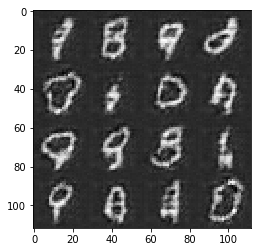

Epoch 1/2... Discriminator Loss: 0.2107... Generator Loss: 2.1791


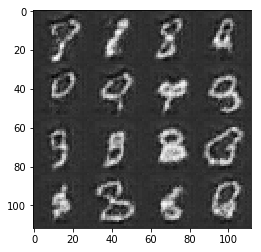

Epoch 1/2... Discriminator Loss: 0.2134... Generator Loss: 2.2523


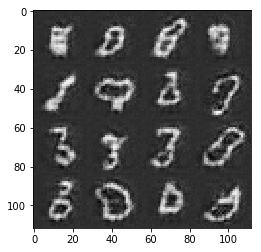

Epoch 1/2... Discriminator Loss: 0.1309... Generator Loss: 2.6973


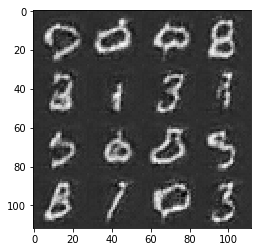

Epoch 1/2... Discriminator Loss: 0.1734... Generator Loss: 2.2041


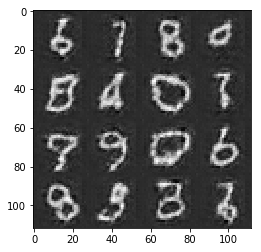

Epoch 1/2... Discriminator Loss: 0.5322... Generator Loss: 3.4803


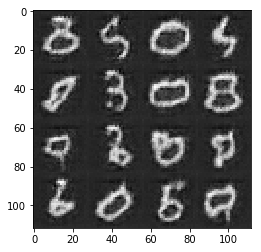

Epoch 1/2... Discriminator Loss: 1.3990... Generator Loss: 0.4114


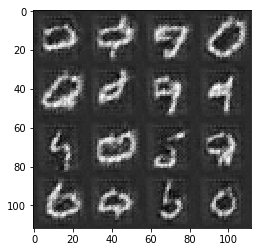

Epoch 1/2... Discriminator Loss: 0.3021... Generator Loss: 1.7831


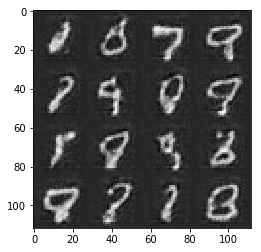

Epoch 1/2... Discriminator Loss: 0.3723... Generator Loss: 1.7858


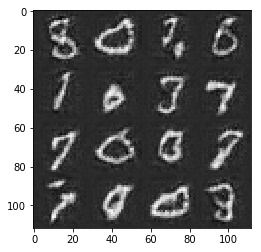

Epoch 1/2... Discriminator Loss: 0.1776... Generator Loss: 2.1894


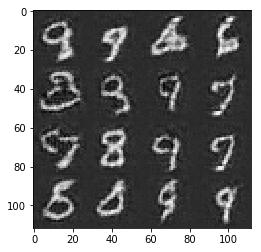

Epoch 1/2... Discriminator Loss: 0.1665... Generator Loss: 2.5487


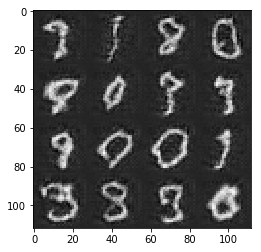

Epoch 1/2... Discriminator Loss: 0.1237... Generator Loss: 3.1942


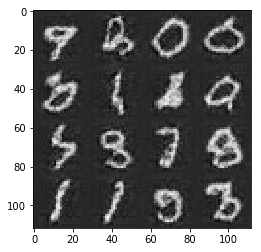

Epoch 1/2... Discriminator Loss: 0.1348... Generator Loss: 2.7466


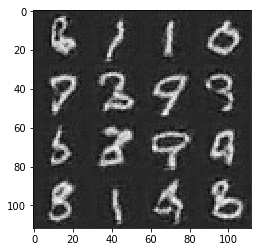

Epoch 1/2... Discriminator Loss: 0.3030... Generator Loss: 2.1216


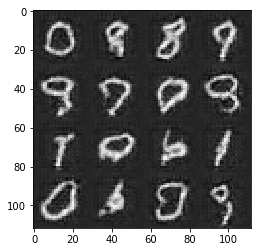

Epoch 1/2... Discriminator Loss: 0.4658... Generator Loss: 1.2596


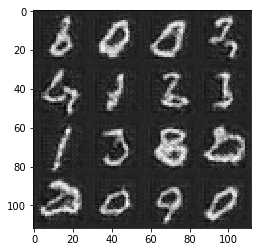

Epoch 1/2... Discriminator Loss: 0.3273... Generator Loss: 1.6014


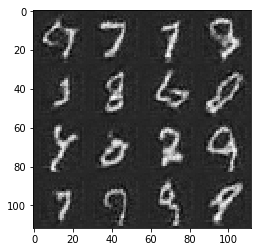

Epoch 1/2... Discriminator Loss: 0.2237... Generator Loss: 2.0357


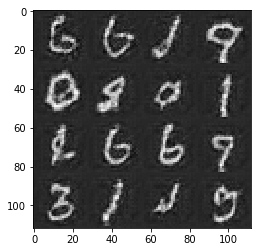

Epoch 1/2... Discriminator Loss: 0.1555... Generator Loss: 2.2916


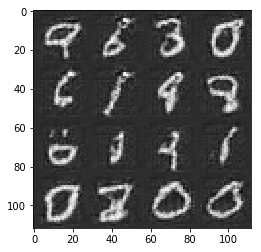

Epoch 1/2... Discriminator Loss: 0.0785... Generator Loss: 3.0460


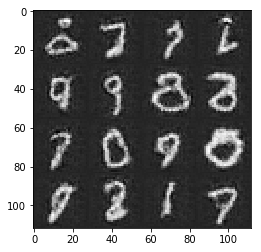

Epoch 1/2... Discriminator Loss: 1.5414... Generator Loss: 0.3691


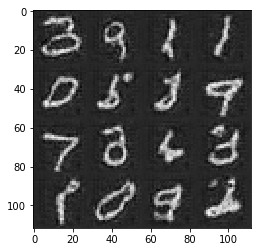

Epoch 2/2... Discriminator Loss: 0.3743... Generator Loss: 2.6785


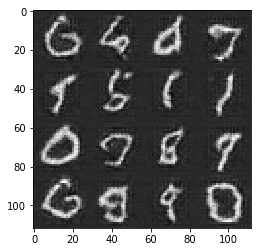

Epoch 2/2... Discriminator Loss: 0.1042... Generator Loss: 2.6580


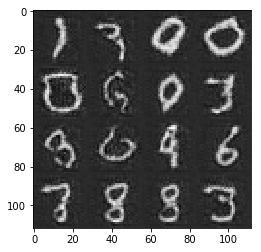

Epoch 2/2... Discriminator Loss: 3.3125... Generator Loss: 0.0530


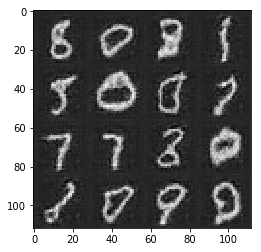

Epoch 2/2... Discriminator Loss: 0.4100... Generator Loss: 2.8366


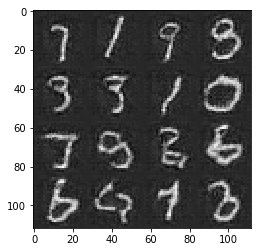

Epoch 2/2... Discriminator Loss: 0.2990... Generator Loss: 2.5530


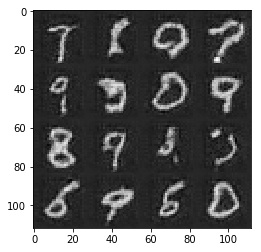

Epoch 2/2... Discriminator Loss: 0.0670... Generator Loss: 4.0777


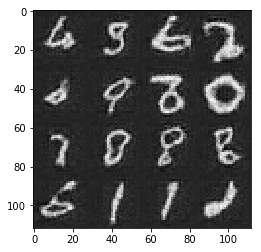

Epoch 2/2... Discriminator Loss: 0.3258... Generator Loss: 2.2448


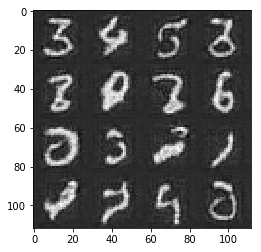

Epoch 2/2... Discriminator Loss: 0.4151... Generator Loss: 2.8469


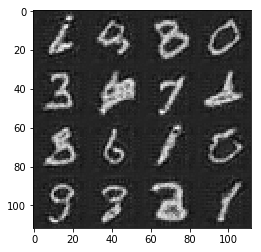

Epoch 2/2... Discriminator Loss: 3.0057... Generator Loss: 0.1062


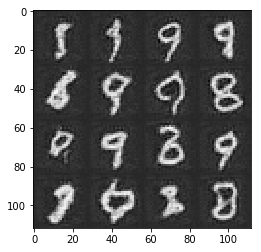

Epoch 2/2... Discriminator Loss: 0.8793... Generator Loss: 0.8034


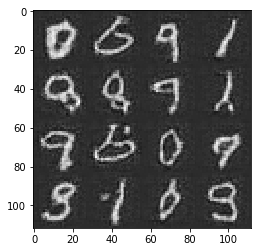

Epoch 2/2... Discriminator Loss: 0.1823... Generator Loss: 2.4412


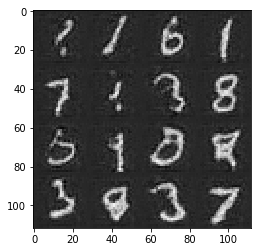

Epoch 2/2... Discriminator Loss: 0.0577... Generator Loss: 4.5280


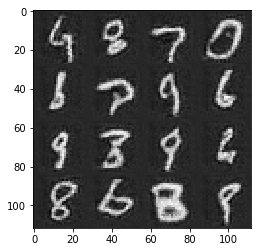

Epoch 2/2... Discriminator Loss: 0.2729... Generator Loss: 1.8493


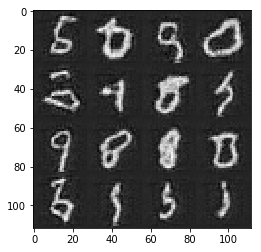

Epoch 2/2... Discriminator Loss: 0.2345... Generator Loss: 2.0427


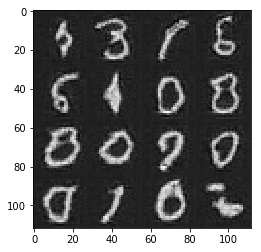

Epoch 2/2... Discriminator Loss: 0.2179... Generator Loss: 2.8237


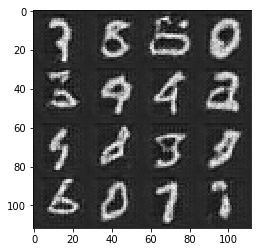

Epoch 2/2... Discriminator Loss: 0.5692... Generator Loss: 1.2744


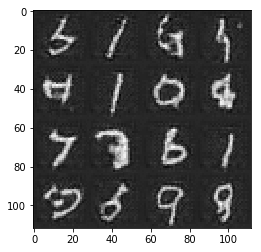

Epoch 2/2... Discriminator Loss: 0.0703... Generator Loss: 4.1135


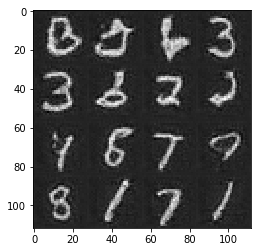

Epoch 2/2... Discriminator Loss: 0.1066... Generator Loss: 3.5111


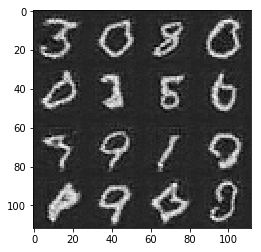

Epoch 2/2... Discriminator Loss: 0.5470... Generator Loss: 1.6087


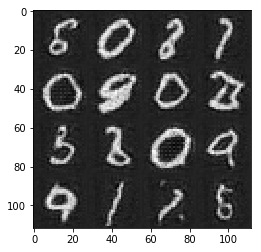

Epoch 2/2... Discriminator Loss: 0.1718... Generator Loss: 2.2117


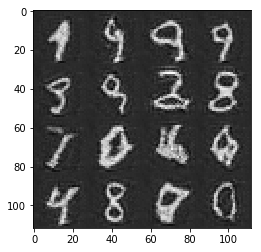

Epoch 2/2... Discriminator Loss: 0.1379... Generator Loss: 3.2024


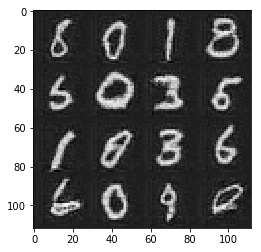

Epoch 2/2... Discriminator Loss: 0.3233... Generator Loss: 1.8481


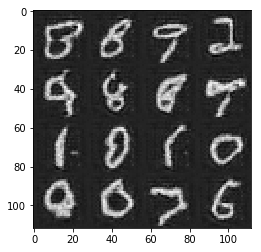

Epoch 2/2... Discriminator Loss: 0.3436... Generator Loss: 1.8673


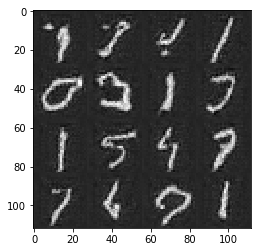

Epoch 2/2... Discriminator Loss: 0.6001... Generator Loss: 1.1547


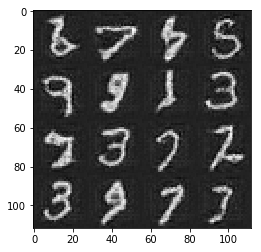

Epoch 2/2... Discriminator Loss: 0.2568... Generator Loss: 2.4270


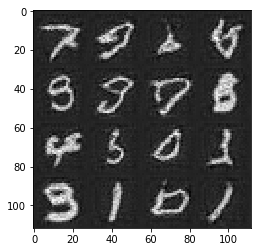

Epoch 2/2... Discriminator Loss: 0.2542... Generator Loss: 1.8292


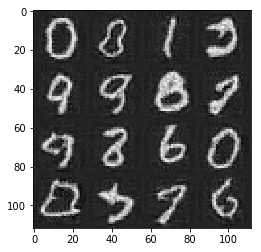

Epoch 2/2... Discriminator Loss: 0.1970... Generator Loss: 2.5591


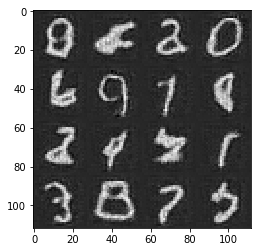

Epoch 2/2... Discriminator Loss: 0.0445... Generator Loss: 3.8331


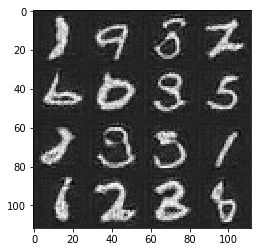

Epoch 2/2... Discriminator Loss: 0.2004... Generator Loss: 2.5595


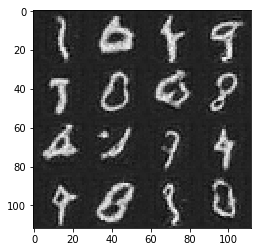

Epoch 2/2... Discriminator Loss: 0.3638... Generator Loss: 1.7719


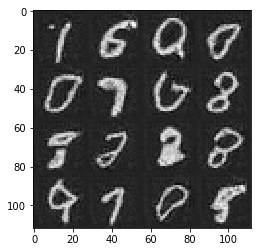

Epoch 2/2... Discriminator Loss: 0.5217... Generator Loss: 1.2527


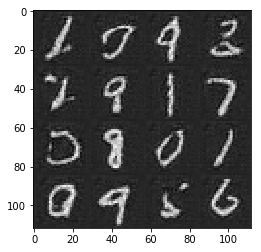

Epoch 2/2... Discriminator Loss: 0.1157... Generator Loss: 2.8693


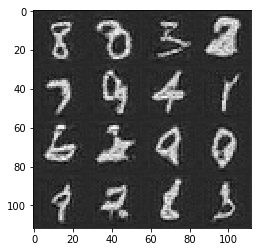

Epoch 2/2... Discriminator Loss: 2.7300... Generator Loss: 0.1220


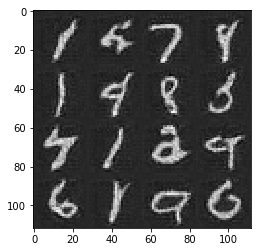

Epoch 2/2... Discriminator Loss: 0.1060... Generator Loss: 3.1507


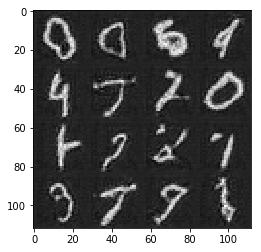

Epoch 2/2... Discriminator Loss: 0.1241... Generator Loss: 2.7240


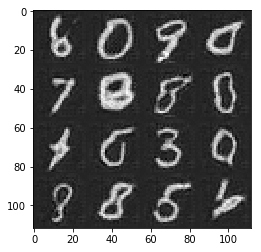

Epoch 2/2... Discriminator Loss: 0.4190... Generator Loss: 1.3807


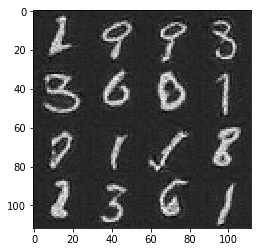

Epoch 2/2... Discriminator Loss: 0.5252... Generator Loss: 1.2357


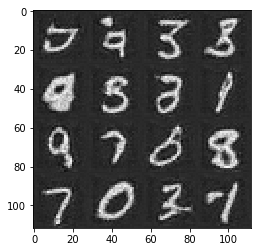

Epoch 2/2... Discriminator Loss: 1.1108... Generator Loss: 4.5580


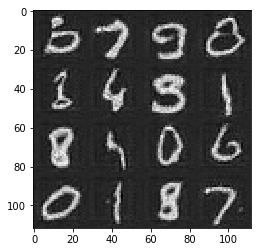

In [122]:
batch_size = 16#32#64#16#128#32 #64,128
z_dim = 100 #128
learning_rate = 0.0002#0.0001#0.0002 #0.0005
beta1 = 0.5 # 0.4,0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 0.0413... Generator Loss: 3.4413


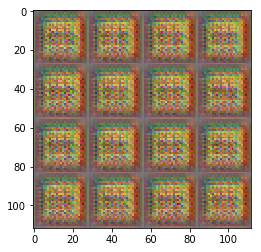

Epoch 1/1... Discriminator Loss: 0.0631... Generator Loss: 3.1525


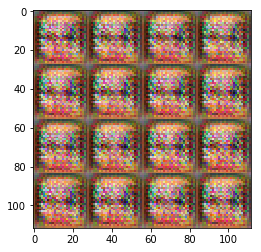

Epoch 1/1... Discriminator Loss: 0.0437... Generator Loss: 3.5586


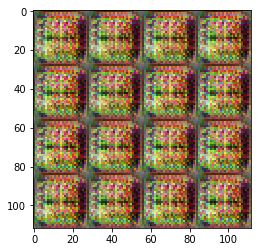

Epoch 1/1... Discriminator Loss: 0.0068... Generator Loss: 5.2221


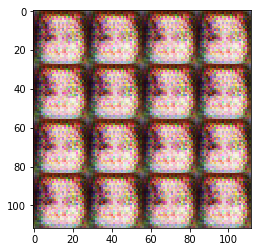

Epoch 1/1... Discriminator Loss: 0.0046... Generator Loss: 5.4895


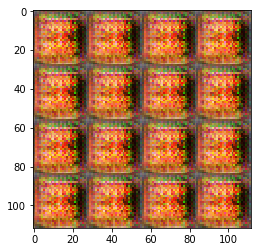

Epoch 1/1... Discriminator Loss: 0.0057... Generator Loss: 5.2823


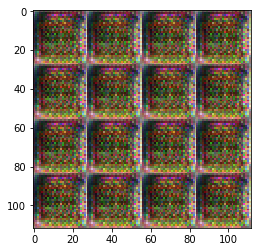

Epoch 1/1... Discriminator Loss: 0.0384... Generator Loss: 13.6050


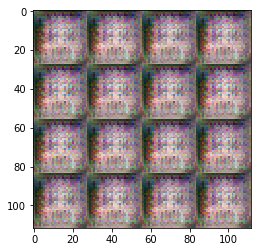

Epoch 1/1... Discriminator Loss: 0.0928... Generator Loss: 4.9822


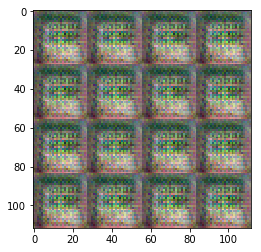

Epoch 1/1... Discriminator Loss: 0.1284... Generator Loss: 2.8359


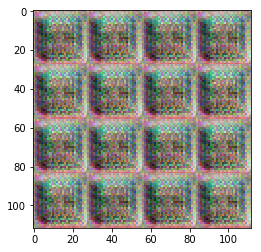

Epoch 1/1... Discriminator Loss: 0.1527... Generator Loss: 2.8844


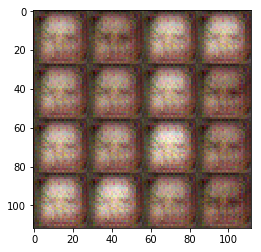

Epoch 1/1... Discriminator Loss: 0.0546... Generator Loss: 3.3315


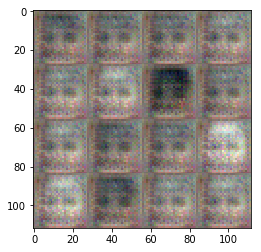

Epoch 1/1... Discriminator Loss: 0.0478... Generator Loss: 4.4854


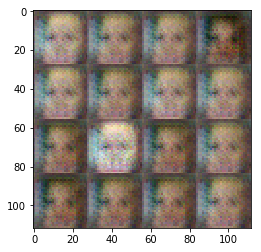

Epoch 1/1... Discriminator Loss: 0.0679... Generator Loss: 4.2395


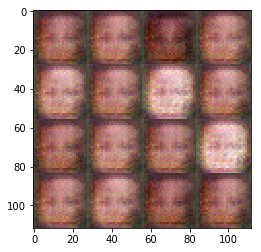

Epoch 1/1... Discriminator Loss: 0.0485... Generator Loss: 3.4507


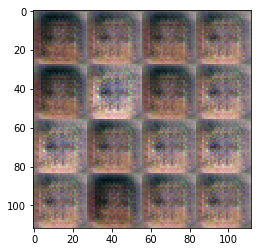

Epoch 1/1... Discriminator Loss: 0.1002... Generator Loss: 2.6605


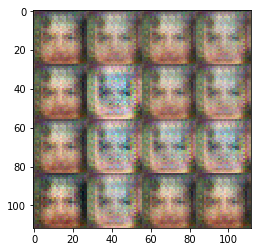

Epoch 1/1... Discriminator Loss: 0.0720... Generator Loss: 3.5506


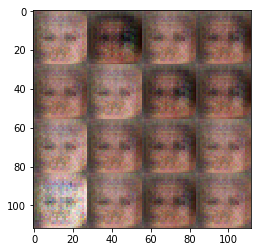

Epoch 1/1... Discriminator Loss: 0.0809... Generator Loss: 2.7627


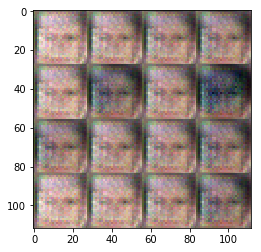

Epoch 1/1... Discriminator Loss: 0.0243... Generator Loss: 5.1312


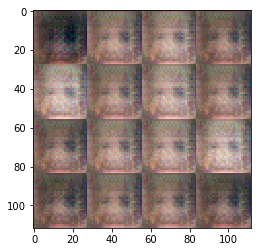

Epoch 1/1... Discriminator Loss: 0.1177... Generator Loss: 2.9022


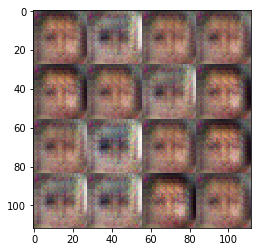

Epoch 1/1... Discriminator Loss: 0.0021... Generator Loss: 7.4615


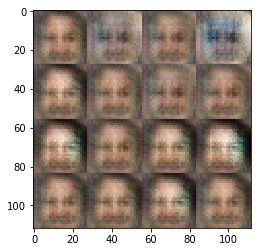

Epoch 1/1... Discriminator Loss: 0.0277... Generator Loss: 4.0154


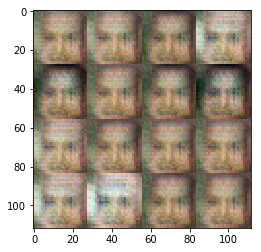

Epoch 1/1... Discriminator Loss: 0.0143... Generator Loss: 5.6594


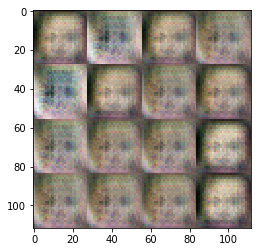

Epoch 1/1... Discriminator Loss: 0.0398... Generator Loss: 4.0190


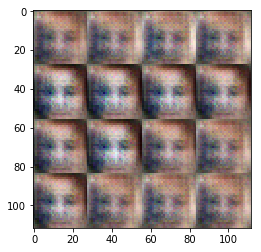

Epoch 1/1... Discriminator Loss: 0.0350... Generator Loss: 6.1648


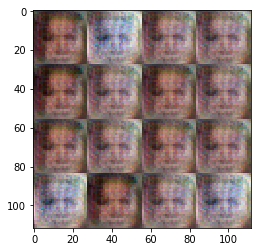

Epoch 1/1... Discriminator Loss: 0.0376... Generator Loss: 4.1773


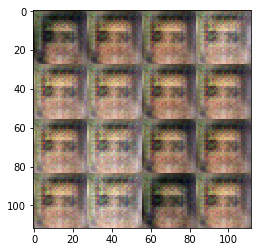

Epoch 1/1... Discriminator Loss: 0.0747... Generator Loss: 2.8942


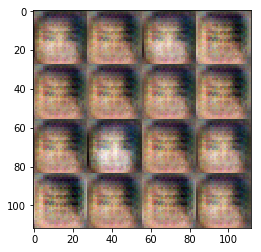

Epoch 1/1... Discriminator Loss: 0.0971... Generator Loss: 3.3867


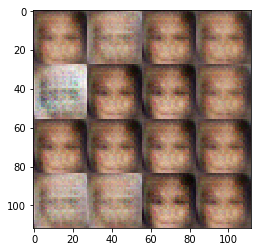

Epoch 1/1... Discriminator Loss: 0.0279... Generator Loss: 5.1266


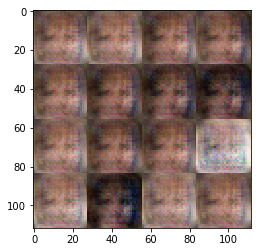

Epoch 1/1... Discriminator Loss: 0.0225... Generator Loss: 6.5267


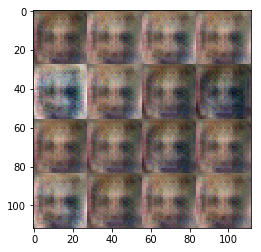

Epoch 1/1... Discriminator Loss: 0.2765... Generator Loss: 11.8756


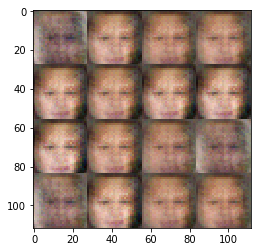

Epoch 1/1... Discriminator Loss: 0.0148... Generator Loss: 4.4745


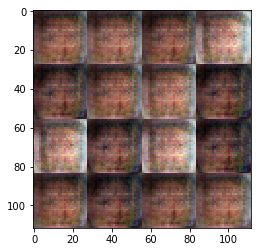

Epoch 1/1... Discriminator Loss: 0.0484... Generator Loss: 5.4538


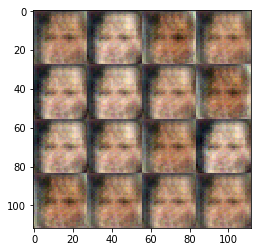

Epoch 1/1... Discriminator Loss: 0.1142... Generator Loss: 2.6009


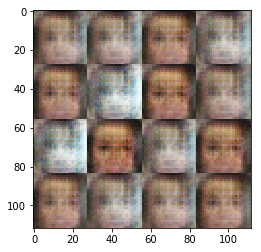

Epoch 1/1... Discriminator Loss: 0.0484... Generator Loss: 4.0341


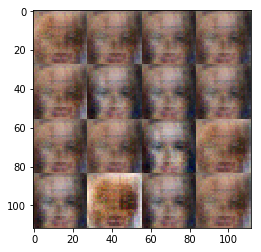

Epoch 1/1... Discriminator Loss: 0.2124... Generator Loss: 1.8168


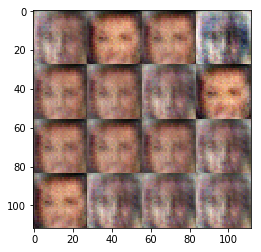

Epoch 1/1... Discriminator Loss: 0.0090... Generator Loss: 10.2759


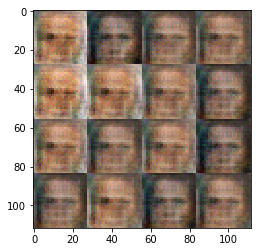

Epoch 1/1... Discriminator Loss: 0.1785... Generator Loss: 1.9906


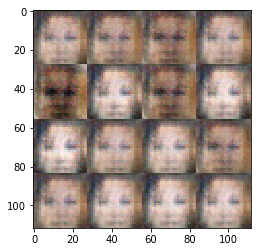

Epoch 1/1... Discriminator Loss: 0.0796... Generator Loss: 3.1061


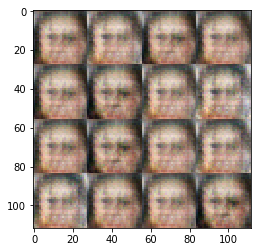

Epoch 1/1... Discriminator Loss: 0.1000... Generator Loss: 6.8388


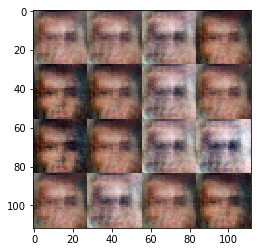

Epoch 1/1... Discriminator Loss: 0.1551... Generator Loss: 2.4371


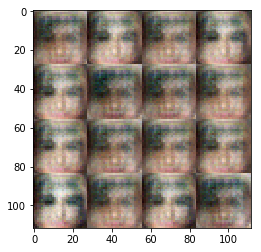

Epoch 1/1... Discriminator Loss: 0.0516... Generator Loss: 3.7639


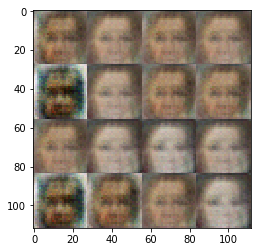

Epoch 1/1... Discriminator Loss: 0.1807... Generator Loss: 2.1200


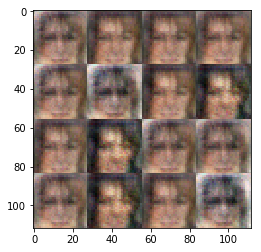

Epoch 1/1... Discriminator Loss: 0.0959... Generator Loss: 2.9539


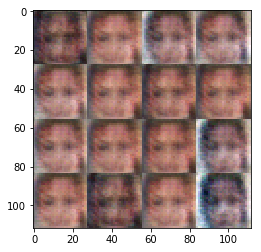

Epoch 1/1... Discriminator Loss: 0.0943... Generator Loss: 2.6185


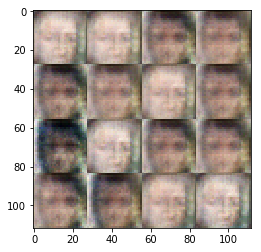

Epoch 1/1... Discriminator Loss: 0.0548... Generator Loss: 3.8647


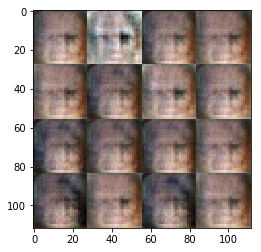

Epoch 1/1... Discriminator Loss: 0.0213... Generator Loss: 4.6119


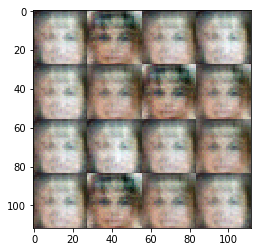

Epoch 1/1... Discriminator Loss: 0.0353... Generator Loss: 4.6249


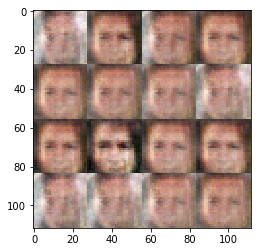

Epoch 1/1... Discriminator Loss: 0.0447... Generator Loss: 3.5081


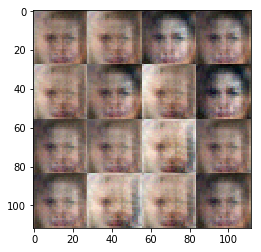

Epoch 1/1... Discriminator Loss: 0.1246... Generator Loss: 2.4691


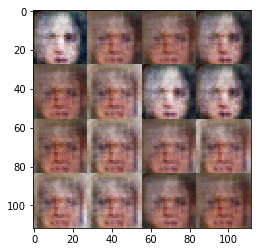

Epoch 1/1... Discriminator Loss: 0.0453... Generator Loss: 3.7744


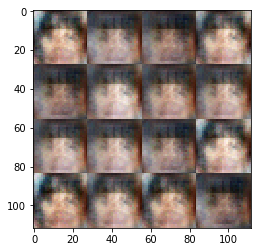

Epoch 1/1... Discriminator Loss: 0.0630... Generator Loss: 4.2908


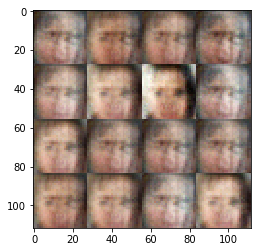

Epoch 1/1... Discriminator Loss: 0.3223... Generator Loss: 2.0673


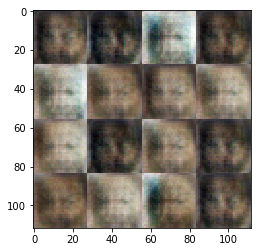

Epoch 1/1... Discriminator Loss: 0.1114... Generator Loss: 8.1801


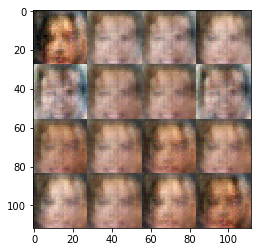

Epoch 1/1... Discriminator Loss: 0.2711... Generator Loss: 1.7318


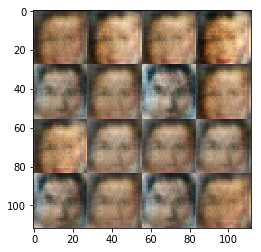

Epoch 1/1... Discriminator Loss: 0.0558... Generator Loss: 3.6367


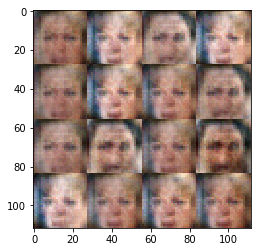

Epoch 1/1... Discriminator Loss: 0.2607... Generator Loss: 1.8636


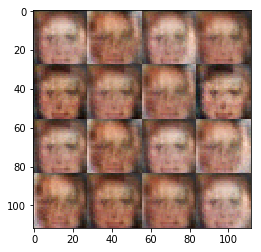

Epoch 1/1... Discriminator Loss: 0.0852... Generator Loss: 3.1869


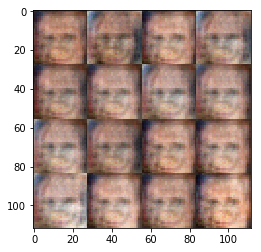

Epoch 1/1... Discriminator Loss: 0.1098... Generator Loss: 3.8265


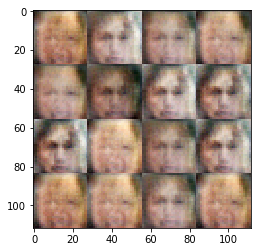

Epoch 1/1... Discriminator Loss: 0.0776... Generator Loss: 2.9383


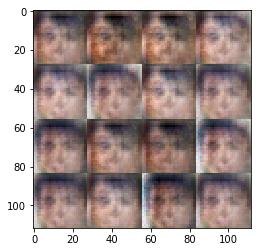

Epoch 1/1... Discriminator Loss: 0.1064... Generator Loss: 3.2803


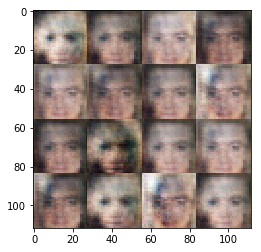

Epoch 1/1... Discriminator Loss: 0.3027... Generator Loss: 1.7601


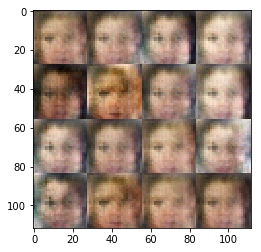

Epoch 1/1... Discriminator Loss: 0.1060... Generator Loss: 3.1372


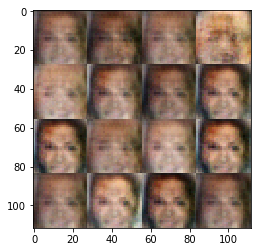

Epoch 1/1... Discriminator Loss: 0.0389... Generator Loss: 5.5096


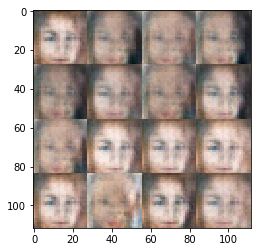

Epoch 1/1... Discriminator Loss: 0.0322... Generator Loss: 5.6682


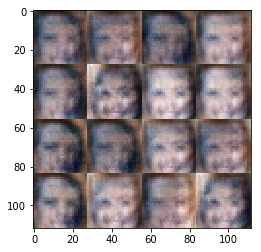

Epoch 1/1... Discriminator Loss: 0.1044... Generator Loss: 2.6895


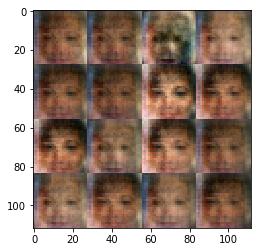

Epoch 1/1... Discriminator Loss: 0.0681... Generator Loss: 3.0691


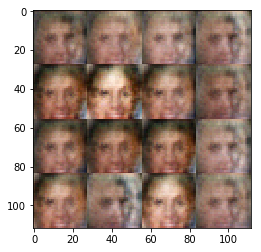

Epoch 1/1... Discriminator Loss: 0.0491... Generator Loss: 4.4259


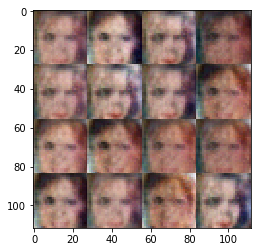

Epoch 1/1... Discriminator Loss: 0.1147... Generator Loss: 3.8890


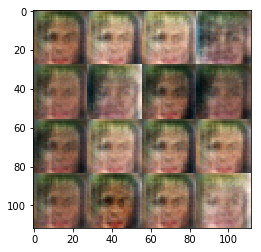

Epoch 1/1... Discriminator Loss: 0.2604... Generator Loss: 10.0382


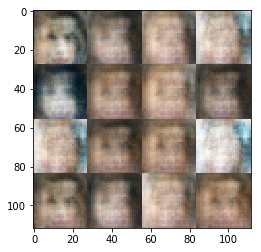

Epoch 1/1... Discriminator Loss: 0.0988... Generator Loss: 3.2262


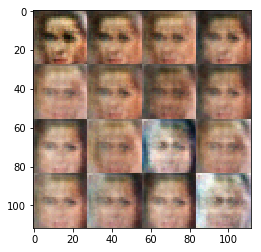

Epoch 1/1... Discriminator Loss: 0.0955... Generator Loss: 3.7013


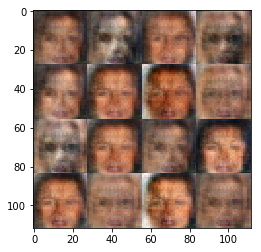

Epoch 1/1... Discriminator Loss: 0.1389... Generator Loss: 2.3028


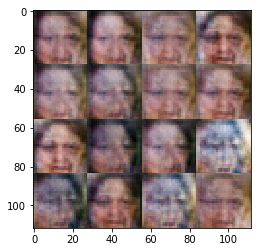

Epoch 1/1... Discriminator Loss: 0.1445... Generator Loss: 2.4053


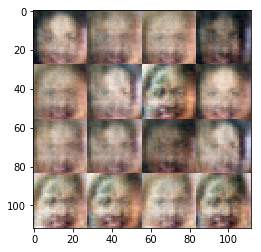

Epoch 1/1... Discriminator Loss: 0.0252... Generator Loss: 5.6347


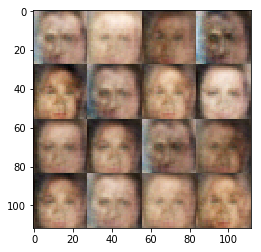

Epoch 1/1... Discriminator Loss: 0.0771... Generator Loss: 2.9130


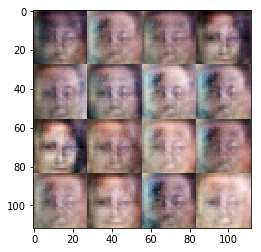

Epoch 1/1... Discriminator Loss: 0.0420... Generator Loss: 3.6628


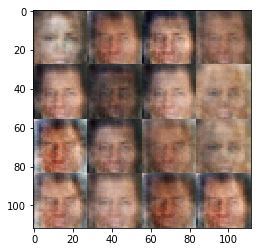

Epoch 1/1... Discriminator Loss: 0.5734... Generator Loss: 1.9996


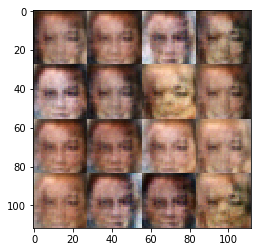

Epoch 1/1... Discriminator Loss: 0.0424... Generator Loss: 3.5108


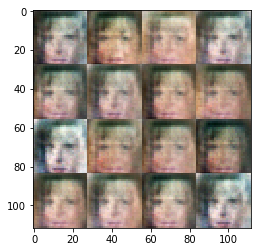

Epoch 1/1... Discriminator Loss: 0.0856... Generator Loss: 6.5386


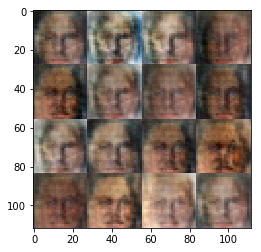

Epoch 1/1... Discriminator Loss: 0.5510... Generator Loss: 1.3172


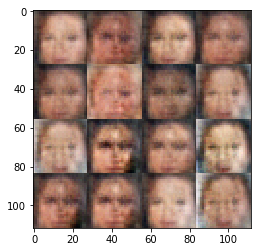

Epoch 1/1... Discriminator Loss: 0.0782... Generator Loss: 3.8864


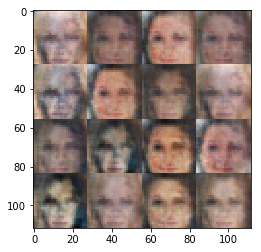

Epoch 1/1... Discriminator Loss: 2.5681... Generator Loss: 12.7828


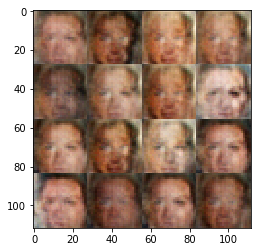

Epoch 1/1... Discriminator Loss: 0.1814... Generator Loss: 2.2373


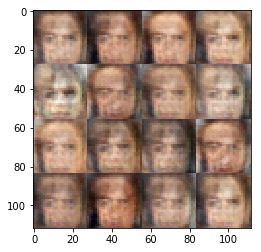

Epoch 1/1... Discriminator Loss: 0.1643... Generator Loss: 2.4967


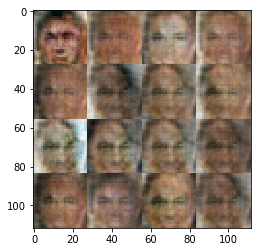

Epoch 1/1... Discriminator Loss: 0.1596... Generator Loss: 2.2353


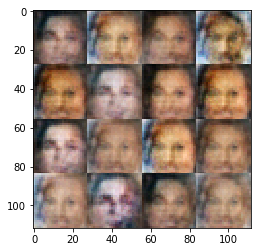

Epoch 1/1... Discriminator Loss: 0.0602... Generator Loss: 3.5840


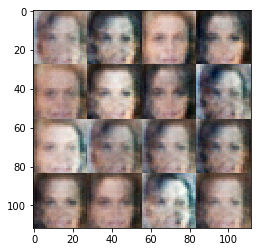

Epoch 1/1... Discriminator Loss: 0.1024... Generator Loss: 3.0245


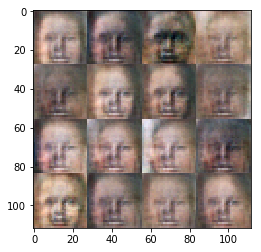

Epoch 1/1... Discriminator Loss: 0.0216... Generator Loss: 5.0621


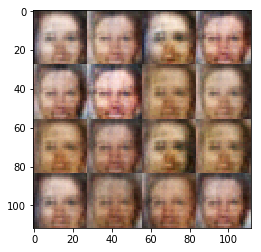

Epoch 1/1... Discriminator Loss: 0.1170... Generator Loss: 2.5619


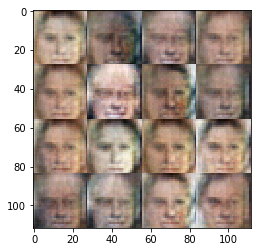

Epoch 1/1... Discriminator Loss: 0.1172... Generator Loss: 2.4477


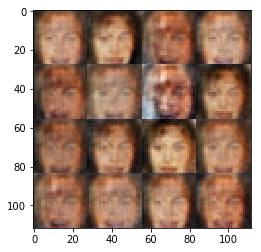

Epoch 1/1... Discriminator Loss: 0.4492... Generator Loss: 1.4826


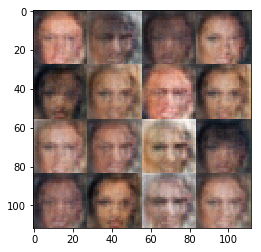

Epoch 1/1... Discriminator Loss: 0.0924... Generator Loss: 2.9439


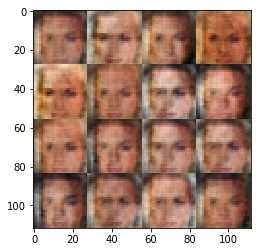

Epoch 1/1... Discriminator Loss: 0.2310... Generator Loss: 2.0005


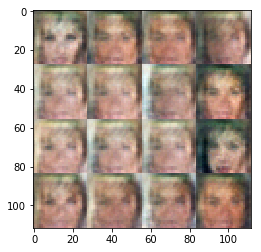

Epoch 1/1... Discriminator Loss: 0.1191... Generator Loss: 3.3314


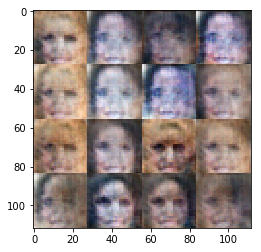

Epoch 1/1... Discriminator Loss: 0.1045... Generator Loss: 3.1817


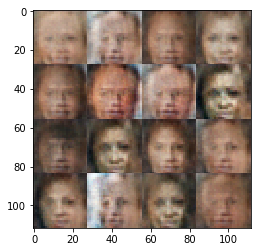

Epoch 1/1... Discriminator Loss: 0.0864... Generator Loss: 3.1135


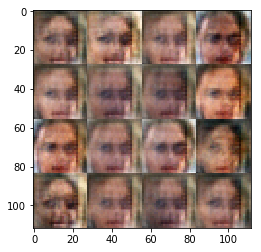

Epoch 1/1... Discriminator Loss: 0.1242... Generator Loss: 3.2426


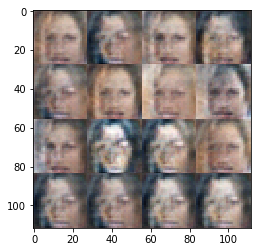

Epoch 1/1... Discriminator Loss: 0.0926... Generator Loss: 3.4579


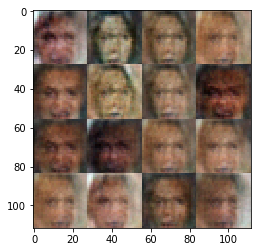

Epoch 1/1... Discriminator Loss: 0.0865... Generator Loss: 3.9108


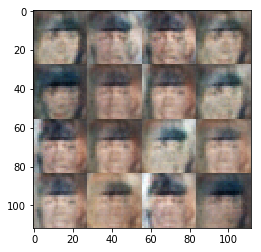

Epoch 1/1... Discriminator Loss: 0.0805... Generator Loss: 3.5339


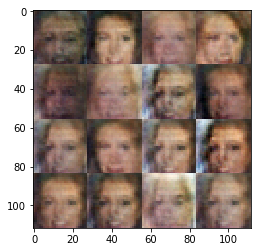

Epoch 1/1... Discriminator Loss: 0.0549... Generator Loss: 3.3961


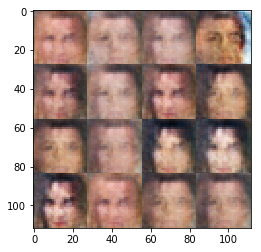

Epoch 1/1... Discriminator Loss: 0.0293... Generator Loss: 8.6733


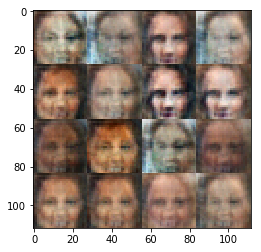

Epoch 1/1... Discriminator Loss: 0.4513... Generator Loss: 1.6572


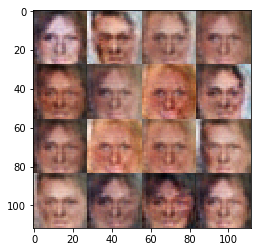

Epoch 1/1... Discriminator Loss: 0.1711... Generator Loss: 2.3095


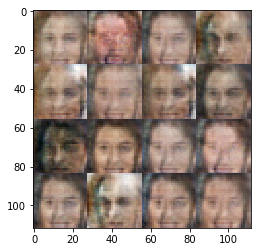

Epoch 1/1... Discriminator Loss: 0.0549... Generator Loss: 4.1425


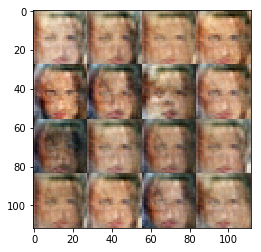

Epoch 1/1... Discriminator Loss: 0.0946... Generator Loss: 3.4793


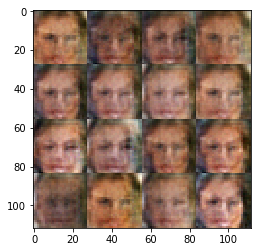

Epoch 1/1... Discriminator Loss: 0.0584... Generator Loss: 8.6347


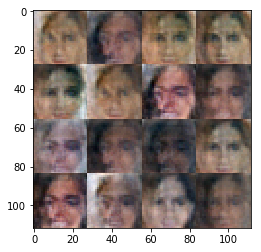

Epoch 1/1... Discriminator Loss: 0.0410... Generator Loss: 3.8969


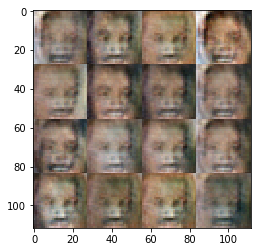

Epoch 1/1... Discriminator Loss: 0.0627... Generator Loss: 4.3380


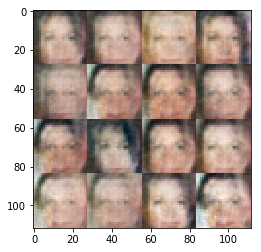

Epoch 1/1... Discriminator Loss: 0.1159... Generator Loss: 3.0496


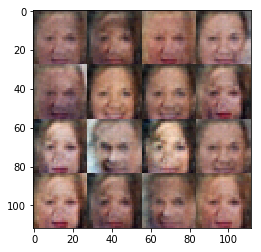

Epoch 1/1... Discriminator Loss: 0.0311... Generator Loss: 4.0301


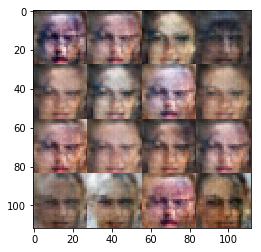

Epoch 1/1... Discriminator Loss: 0.1980... Generator Loss: 2.3936


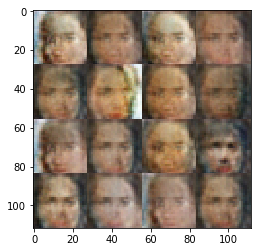

Epoch 1/1... Discriminator Loss: 0.0843... Generator Loss: 3.1991


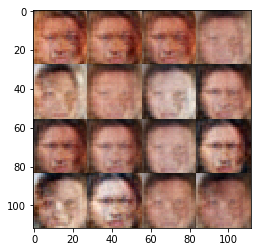

Epoch 1/1... Discriminator Loss: 0.3390... Generator Loss: 1.4812


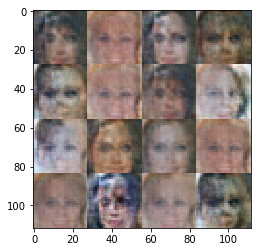

Epoch 1/1... Discriminator Loss: 0.0879... Generator Loss: 3.7065


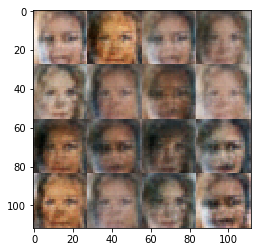

Epoch 1/1... Discriminator Loss: 0.0211... Generator Loss: 6.7194


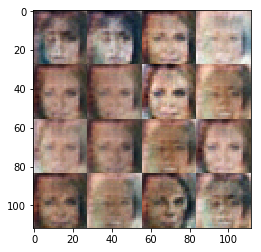

Epoch 1/1... Discriminator Loss: 0.5936... Generator Loss: 0.9952


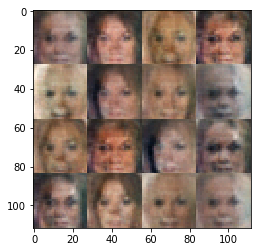

Epoch 1/1... Discriminator Loss: 0.0843... Generator Loss: 4.1130


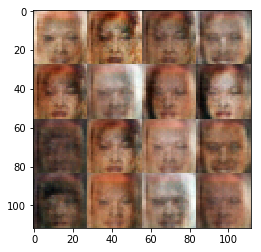

Epoch 1/1... Discriminator Loss: 0.0424... Generator Loss: 4.1808


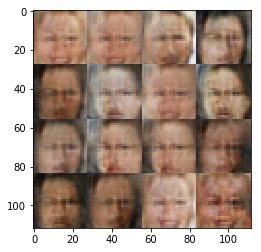

Epoch 1/1... Discriminator Loss: 0.0628... Generator Loss: 3.1903


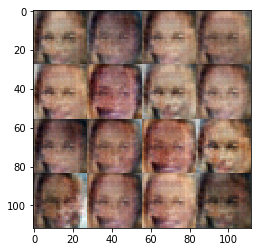

Epoch 1/1... Discriminator Loss: 0.0780... Generator Loss: 3.0535


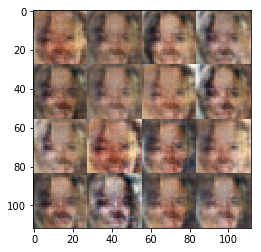

Epoch 1/1... Discriminator Loss: 0.0891... Generator Loss: 3.1423


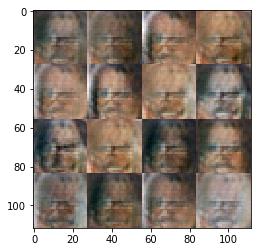

Epoch 1/1... Discriminator Loss: 0.0529... Generator Loss: 3.7031


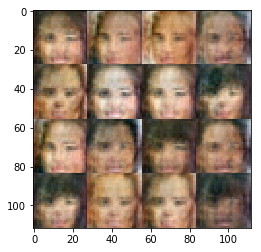

Epoch 1/1... Discriminator Loss: 0.0913... Generator Loss: 3.2968


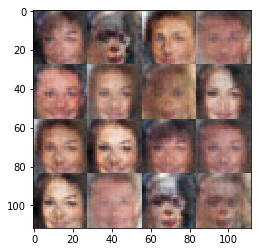

Epoch 1/1... Discriminator Loss: 0.4836... Generator Loss: 1.1607


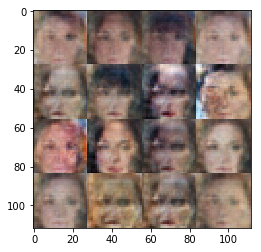

Epoch 1/1... Discriminator Loss: 0.0092... Generator Loss: 7.0887


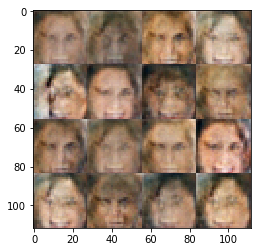

In [126]:
batch_size = 16#32
z_dim = 100
learning_rate = 0.0001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.